In [1]:
import sys
sys.path.append('/dls_sw/apps/scisoftpy/2.7')
sys.path.append('/dls_sw/i16/software/python')
from dlstools import *
from dlstools.pdnx import *
from matplotlib.pyplot import *
from dlstools.quickfit import *
from dlstools.dirty_fit import fit
from mpl_toolkits.mplot3d import Axes3D ########## was not previously required!!
#%matplotlib inline
#%matplotlib nbagg
p='/dls/i16/data/2019/mm22314-1/%i.nxs'

=== Importing dlstools package


In [ ]:
#first set of 006 scans - forgot go peak so peak not centred in ROI; reanalyse with different ROI?
#SPC peak tracking code

Text(0.5,1,u'/dls/i16/data/2019/mm22314-1/746519.nxs\nscan pil3_tresh 8 12 0.1 pil3_100k 1 roi2')

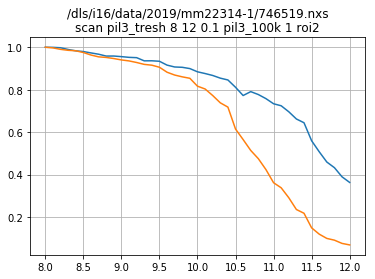

In [28]:
figure()
n=pdnx(p % 746518)
plot(n.pil3_tresh, n.roi2_sum/max(n.roi2_sum))
n=pdnx(p % 746519)
plot(n.pil3_tresh, n['sum']/max(n['sum']))
grid(1); title(n.scan)

Text(0.5,1,u'/dls/i16/data/2019/mm22314-1/746700.nxs\nscan psi -95.5 -92.5 0.1 hkl [-0.000295277909502234, 0.004222670836778963, 5.999998511229894] pil3_100k 0.5 roi1 roi2\nSample 3')

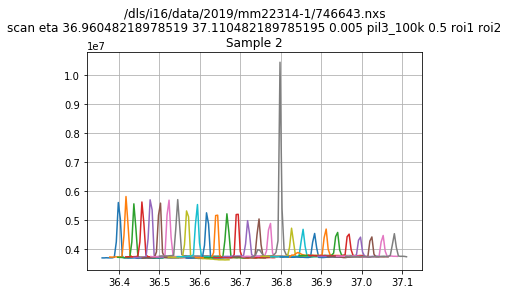

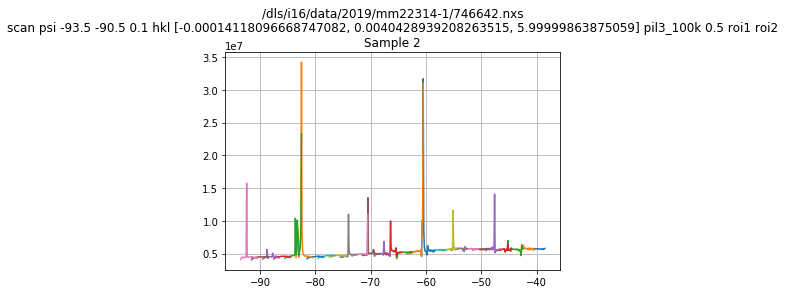

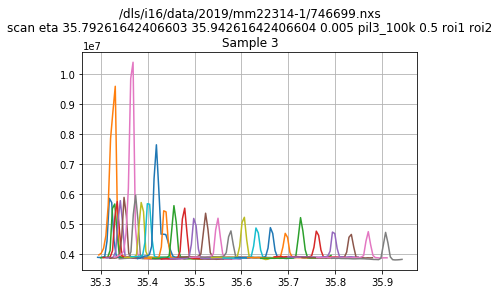

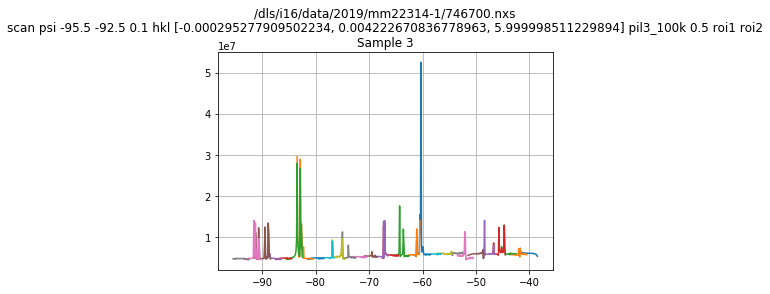

In [42]:
figure()
for scan in range(746589, 746643+1, 2):
    n=pdnx(p % scan)
    plot(n.eta, n.roi2_sum)
grid(1); title(n.scan+'\nSample 2')

figure()
for scan in range(746589+1, 746643+1, 2):
    n=pdnx(p % scan)
    plot(n.psi, n.roi2_sum)
grid(1); title(n.scan+'\nSample 2')

figure()
for scan in range(746645, 746700+1, 2):
    n=pdnx(p % scan)
    plot(n.eta, n.roi2_sum)
grid(1); title(n.scan+'\nSample 3')

figure()
for scan in range(746645+1, 746700+2, 2):
    n=pdnx(p % scan)
    plot(n.psi, n.roi2_sum)
grid(1); title(n.scan+'\nSample 3')

In [43]:
n=pdnx(p % 746728)

In [48]:
print n.nx.tree
#n.find('ic1_monitor')

root:NXroot
  entry1:NXentry
    before_scan:NXcollection
      alpha:NXcollection
        alpha = -14.3980893944
      beamline_slits:NXcollection
        s1xcentre = -0.0025
        s1xgap = 2.499
        s1ycentre = 0.0025
        s1ygap = 1.001
        s2xcentre = -2.49999999999e-05
        s2xgap = 20.0015
        s2ycentre = 3.20175
        s2ygap = 20.0005
        s3xcentre = 4.4575
        s3xgap = 24.998
        s3ycentre = -0.69
        s3ygap = 20.091
        s4xcentre = -6.01275
        s4xgap = 31.9469
        s4ycentre = -0.115
        s4ygap = 25.213
        shtr3x = 11.925
        shtr3y = 4.24
      beta:NXcollection
        beta = 14.3919947354
      delta_offset:NXcollection
        delta_offset = 0.0
      dettrans:NXcollection
        dettrans = 0.0
      diffractometer_sample:NXcollection
        chi = 90.6312730326
        delta = 72.8748227087
        delta_axis_offset = 8.8
        en = 11.119994739
        eta = 35.5147819482
        gam = 0.0
        h = -0.0

<IPython.core.display.Javascript object>


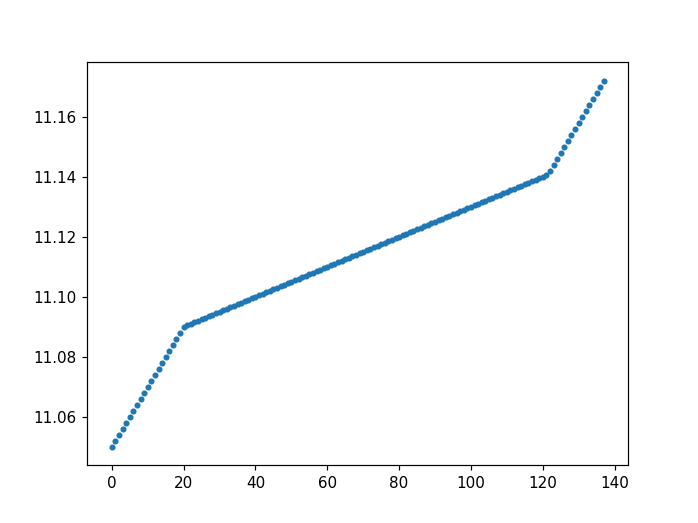

36.8


In [81]:
%matplotlib nbagg
xx=list(np.arange(11.05,11.088+0.002,0.002))+list(np.arange(11.09, 11.14+0.0005, 0.0005))+list(np.arange(11.142,11.17+0.002,0.002))
figure()
plot(xx,'.')
print len(xx)*16./60

<IPython.core.display.Javascript object>


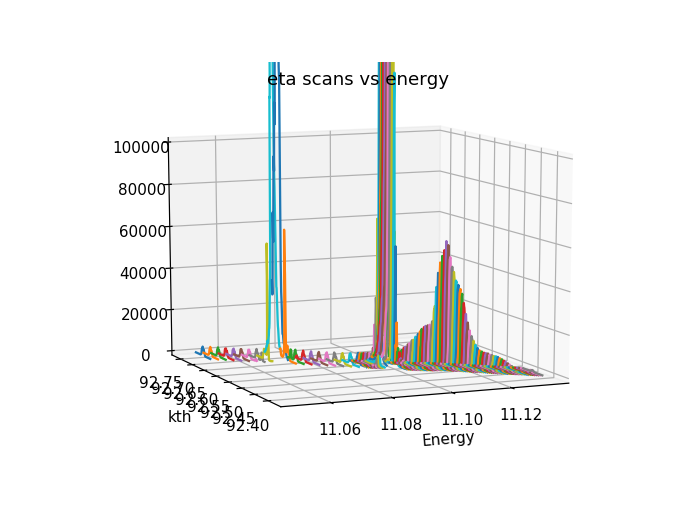

Text(0.5,0.92,u'eta scans vs energy')

In [78]:


figure()
for scan in range(746756, 746864):
    n=pdnx(p % scan)
    n['energy']=n.nx.entry1.before_scan.mono.en
    #gca(projection='3d').plot(n.energy, n.kthZebra, n.roi1_sum)
    gca(projection='3d').plot(n.energy, n.kthZebra, n.maxval)
xlabel('Energy'); ylabel('kth'); title('eta scans vs energy')


In [79]:
gca().set_zlim(0,1e5)

(0, 100000.0)

In [ ]:
#schiroi=HardwareTriggerableDetectorDataProcessor('schiroi', pil3, [SumMaxPositionAndValue()])
#iw=25; jw=3; schiroi.setRoi(int(ci-iw/2.),int(cj-jw/2.),int(ci+iw/2.),int(cj+jw/2.))

#start #762519
#17:58 18/4/19

energy.setOutputFormat([u'%5.5f', u'%5.5f', u'%5.5f'])

psivals={}

psivals[1]=[10.5, 18, 34, 39.5]
psivals[2]=[0, 4.5, 18, 33, 40.5]
psivals[3]=[0, 10.5, 18, 39.5]
psivals[4]=[0, 10.5, 18, 34.5] 


pos atten 0 #more atten for actual measurements

addmeta ic1
waitforinjection.due = 25

for tval in frange(300,50,50)+[10]:
    pos tset tval
    pos w 5
    pos tset tval
    pos w (Ta()-tset())*10+60 #allow 1 sec per 0.1K for cooling
    pos tset tval
    for sample in [1,2,3,4]:
        gosample(sample)
        pos x sample
        pos energy 11.111
        uncon omega; uncon bisect; con mu 0; con psi
        pos psic psivals[sample][0]
        pos pil3 .5
            
        pos atten 255
        pos hkl [0 0 4]
        scancn eta .01 61 checkbeam pil3 .1
        go maxval
        scancn chi .04 61 checkbeam pil3 .1 chiroi
        go maxval
        scancn eta .002 21 checkbeam pil3 .1
        go maxval
        scancn delta .02 41 checkbeam pil3 .1 delroi
        go maxval
        hh004 = hkl()
        hh006 = [hh004[0]*1.5, hh004[1]*1.5, hh004[2]*1.5]
        pos atten 50 #10%
        for psival in psivals[sample]:
            pos pil3 .1
            pos psic psival-.1
            pos energy 11.111
            pos hkl hh006
            pos atten 0
            scancn eta .01 61 checkbeam pil3 .2 scroi lcroi wcroi
            go maxval
            scancn chi .02 61 checkbeam pil3 .2 schiroi
            go maxval
            scancn eta .002 21 checkbeam pil3 .2 scroi lcroi wcroi
            go maxval
            hh = hkl()
            tkhrange=0.08
            for enval in frange(11.09, 11.10, 0.001)+frange(11.1005, 11.125, 0.0005)+frange(11.126, 11.150, 0.001):
                pos energy enval
                pos hkl hh
                pos pil3 .1
                kthcen=kth()
                waitforinjection()
                checkbeam()
                cvscan kthZebra kthcen-tkhrange/2 kthcen+tkhrange/2 .001 pil3 .1 lcroi scroi wcroi

## Reninger interference scans from Monday night

pos tset 10
waitforinjection.due = 30

pos s3xgap 25
pos ic1.gain 4
pos energy 11.111
pos atten 25
uncon omega; uncon bisect; con mu 0; con psi


hh={}
psicen={}


### 006 energy spectrum with multiple scattering crossing

psicenlist = {}
psicenlist[1] = [21, 21-90, 26-90, 43.5-90]
psicenlist[4] = [21, 21-90, 26-90, 33.5-90, 38.5-90, 43.5-90]

for sample in [4]:
    gosample(sample)
    pos x sample
    for psicenval in psicenlist[sample]:
        pos energy 11.111
        pos pil3 .5 
        uncon omega; uncon bisect; con mu 0; con psi
        
        psicen[sample] = psicenval
        tkhrange=0.1
        pos psic psicen[sample]
        pos hkl [0 0 6]
        scancn eta .01 121 checkbeam pil3 .5 wcroi
        go maxval
        scancn chi .02 61 checkbeam pil3 .5 schiroi
        go maxval
        hh = hkl()

        #for enval in frange(11.09, 11.14, 0.001):
        for enval in [11.1, 11.105, 11.111, 11.122, 11.134]:
            for psival in frange(psicen[sample]-2.5, psicen[sample]+2.5, 0.1):
                pos psic psival
                pos pil3 .5
                pos energy enval
                pos hkl hh
                kthcen=kth()
                waitforinjection()
                checkbeam()
                cvscan kthZebra kthcen-tkhrange/2 kthcen+tkhrange/2 .001 pil3 .1 lcroi scroi wcroi


add_default meta

In [83]:
#start 762519

#scan=764052
while True:
    try:
        n=pdnx(p % scan)
        if 'chi' in n.scan and 'schiroi' in n.scan:
            n.plt('chi','schiroi_sum')
        if 'chi' in n.scan and 'roi4' in n.scan:
            n.plt('chi','roi4_sum')     
        if 'eta' in n.scan and 'wcroi' in n.scan:
            n.plt('eta','wcroi_sum')
        if 'eta' in n.scan and not 'wcroi' in n.scan:
            n.plt('eta','sum')
        if 'delta' in n.scan:
            n.plt('delta','roi3_sum') 
        scan+=1
    except:
        print "Can't load file: ", scan
        break



=== Error loading file /dls/i16/data/2019/mm22314-1/774174.nxs
Can't load file:  774174


/dls/i16/data/2019/mm22314-1/764052.nxs
scan eta 37.29143000948501 37.891430009485006 0.01 BeamOK pil3_100k 0.2 roi1 roi2 wcroi
True
.nx.entry1.before_scan.lakeshore.Ta : 	249.951


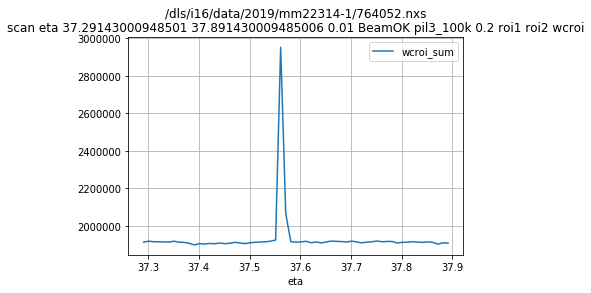

In [50]:
n=pdnx(p % (764052))
print n.scan
n
print ('eta' in n.scan and 'wcroi' in n.scan)
n.plt('eta','wcroi_sum')
n.find('Ta')

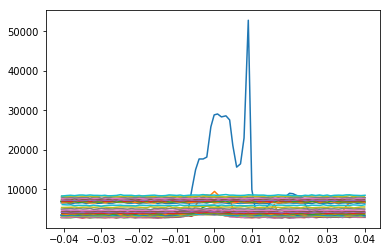

In [9]:
figure()
for scan in range(760127, 760158):    
    n=pdnx(p % scan)
    if 'kthZebra' in n.scan:
        plot(n.kthZebra-np.mean(n.kthZebra),n['wcroi_sum'])
        #print scan, n.nx.entry1.before_scan.gains_atten.Atten, n.nx.entry1.before_scan.psi.psi, n.nx.entry1.before_scan.positions.sx, n.nx.entry1.before_scan.positions.sy


In [31]:
ntemps=7
#oneT=4*4.5*22*67./3600
oneT=4*4.5*22*86./3600
print "total hours=", oneT*ntemps
print "hours each temp =", oneT
print "one azimuth = ", 22*86./3600



total hours= 66.22
hours each temp = 9.46
one azimuth =  0.525555555556


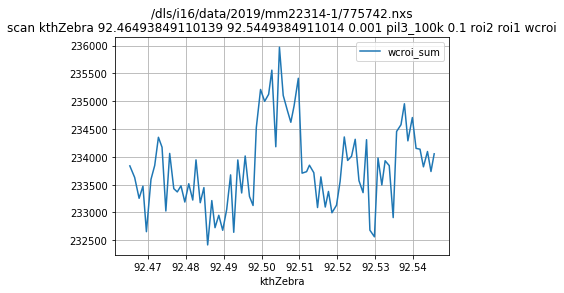

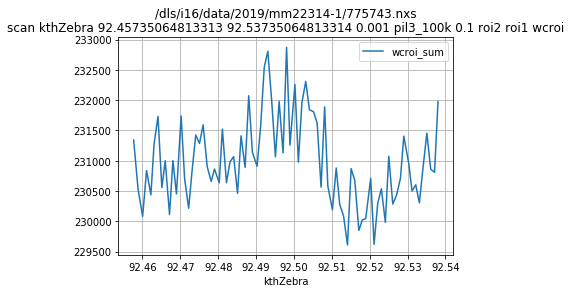

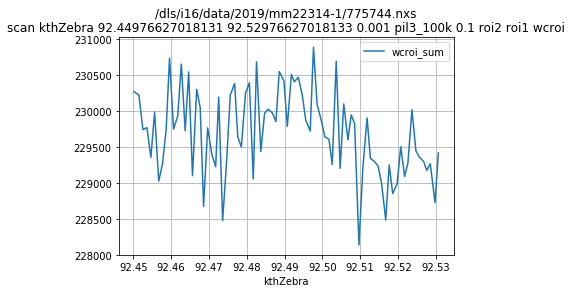

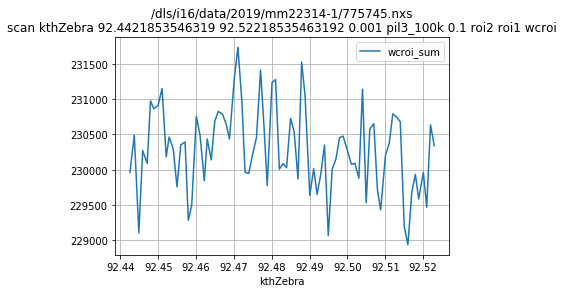

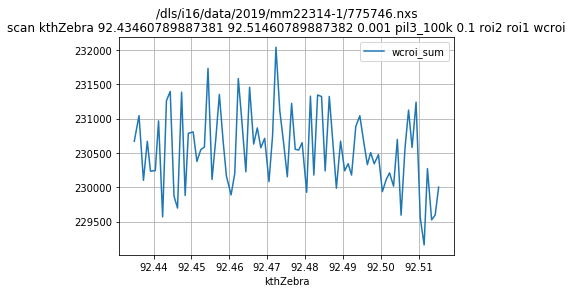

...

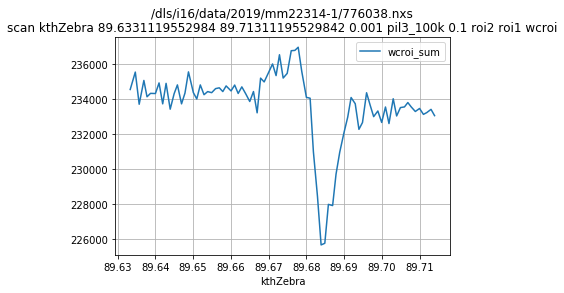

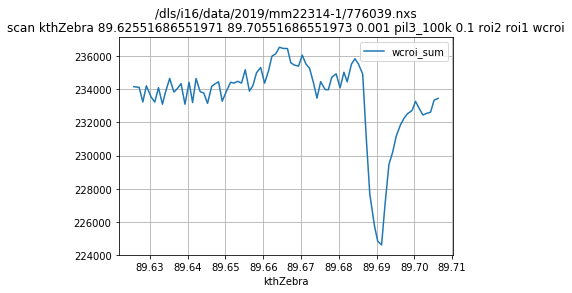

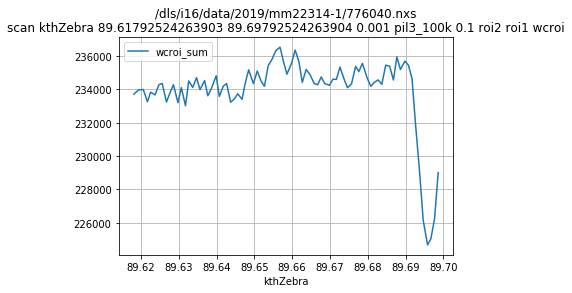

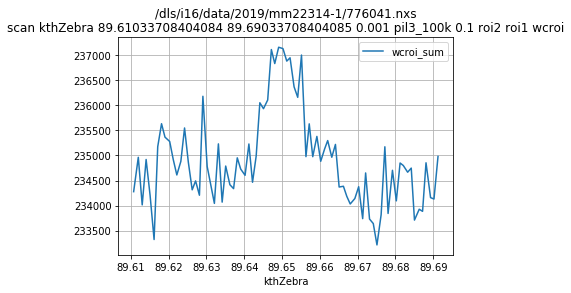

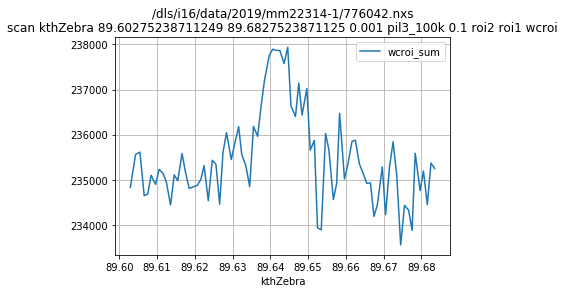

In [27]:
for scan in range(775742, 776045):
    n=pdnx(p % scan)
    try:
        n.plt('kthZebra', 'wcroi_sum')
    except:
        pass

In [25]:
n=pdnx(p % 775816)

In [26]:
n

,count_time,kthZebra,maxval,maxx,maxy,path,roi1_maxval,roi1_maxx,roi1_maxy,roi1_sum,roi2_maxval,roi2_maxx,roi2_maxy,roi2_sum,sum,wcroi_maxval,wcroi_maxx,wcroi_maxy,wcroi_sum
0,0.1,93.439913,1670.0,234.0,95.0,0.0,1661.0,0.0,8.0,23321.0,1670.0,17.0,25.0,208037.0,8259033.0,1670.0,7.0,50.0,251209.0
1,0.1,93.441193,1919.0,235.0,95.0,1.0,1919.0,0.0,8.0,24622.0,1919.0,18.0,25.0,210102.0,8261957.0,1919.0,8.0,50.0,253198.0
2,0.1,93.442240,2037.0,235.0,95.0,2.0,2037.0,0.0,8.0,24941.0,2037.0,18.0,25.0,209432.0,8257196.0,2037.0,8.0,50.0,253191.0
3,0.1,93.443302,2540.0,235.0,95.0,3.0,2540.0,0.0,8.0,27285.0,2540.0,18.0,25.0,212348.0,8257526.0,2540.0,8.0,50.0,256222.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,0.1,93.517229,648.0,241.0,93.0,77.0,648.0,6.0,6.0,21664.0,648.0,24.0,23.0,199143.0,8248129.0,648.0,14.0,48.0,243067.0
78,0.1,93.518284,609.0,241.0,93.0,78.0,609.0,6.0,6.0,21243.0,609.0,24.0,23.0,198155.0,8244825.0,609.0,14.0,48.0,241690.0
79,0.1,93.519462,613.0,241.0,93.0,79.0,613.0,6.0,6.0,21243.0,613.0,24.0,23.0,198115.0,8248104.0,613.0,14.0,48.0,240923.0
80,0.1,93.520511,600.0,241.0,93.0,80.0,600.0,6.0,6.0,21125.0,600.0,24.0,23.0,197810.0,8252216.0,600.0,14.0,48.0,241479.0
